I selected the **City of Markham Road Network** dataset in **GeoJSON** format.  
This is a **geospatial line dataset** where each feature represents a road segment with spatial geometry and associated attributes such as:

- **FULLNAME** (road name)
- **TYPE** (road type/category)
- **OWNER** (road ownership/jurisdiction)

Because the dataset already includes geographic geometry (coordinates), no separate geocoding step was required.

**Dataset link:** https://data-markham.opendata.arcgis.com/datasets/264f35f118324ee0a40ffa53714b23fe_0/explore?location=43.880000%2C-79.301700%2C11

In [1]:
# Install required packages

%pip install -q geopandas pandas numpy matplotlib folium shapely pyproj pyogrio mapclassify branca

Note: you may need to restart the kernel to use updated packages.


In [2]:
# ============================================================
# 0) Imports and Display Configuration
# ============================================================

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
import branca.colormap as cm

from folium.plugins import HeatMap, FastMarkerCluster
from shapely import affinity
from IPython.display import display

# Display all DataFrame columns during exploratory inspection
pd.set_option("display.max_columns", None)

In [3]:
# ============================================================
# 1) Load Dataset: Markham Road Network (GeoJSON)
# ============================================================

DATA_PATH = "https://raw.githubusercontent.com/MynulVG/ISE_571_Heuristic-_Search_Methods_g202528630_Assignment_1/main/Road_Network.geojson"

# Read spatial dataset
roads = gpd.read_file(DATA_PATH)

# Quick diagnostics
print(f"Records: {len(roads):,}")
print(f"Columns: {roads.shape[1]}")
print(f"CRS: {roads.crs}")

# Preview
display(roads.head())
print("Available fields:", list(roads.columns))

Records: 9,120
Columns: 24
CRS: EPSG:4326


,OBJECTID,NAME,TYPE,FULLNAME,PREDIR,FNAMECAP,ROUTE_ID,SEG_NO,OWNER,FROM_ST_1,FROM_ST_2,FROM_ST_3,TO_ST_1,TO_ST_2,TO_ST_3,DIRECTION,L_F_ADD,L_T_ADD,R_F_ADD,R_T_ADD,CITY_LEFT,CITY_RIGHT,GLOBALID,geometry
0,1,Ashglen,Way,Ashglen Way,None,ASHGLEN WAY,81019,001,Private Road,Sciberras Rd,NaN,NaN,Ashglen Way,NaN,NaN,NaN,0.0,0.0,0.0,0.0,MARKHAM,MARKHAM,{2F18A4C5-2D98-40EE-9BA6-C1E057E00CEA},"LINESTRING (-79.31759 43.86024, -79.3175 43.86..."
1,2,Woodbine,Ave,Woodbine Ave,None,WOODBINE AVE,90131,065,Region of York,Burncrest Rd,Miller Ave,NaN,407 EB From NB Woodbine Ave - Exit 84,NaN,NaN,NaN,7900.0,7998.0,7901.0,7999.0,MARKHAM,MARKHAM,{FFEEE707-61C3-489E-8B86-5FECDDC40C90},"LINESTRING (-79.35493 43.83762, -79.35506 43.8..."
2,3,Rose,Way,Rose Way,None,ROSE WAY,07935,007,City of Markham,Linden Lea St,NaN,NaN,Church St,NaN,NaN,NaN,68.0,80.0,65.0,79.0,MARKHAM,MARKHAM,{B298B0FF-7657-4FF6-BE01-B9235831C645},"LINESTRING (-79.2402 43.88169, -79.2405 43.882..."
3,4,Colleen Bay,Way,Colleen Bay Way,None,COLLEEN BAY WAY,81736,001,Private Road,Kingfisher Cove Way,NaN,NaN,EOP,NaN,NaN,NaN,2.0,8.0,0.0,0.0,MARKHAM,MARKHAM,{27133A0F-5488-4B41-9C11-BC8F14D19B81},"LINESTRING (-79.2482 43.89598, -79.24824 43.89..."
4,5,Warnock Green,Way,Warnock Green Way,None,WARNOCK GREEN WAY,81612,004,Private Road,Warnock Green Way,NaN,NaN,EOP,NaN,NaN,NaN,0.0,0.0,0.0,0.0,MARKHAM,MARKHAM,{577E7271-D5A7-418B-B7D5-84E63C446CB1},"LINESTRING (-79.24927 43.89801, -79.24923 43.8..."


Available fields: ['OBJECTID', 'NAME', 'TYPE', 'FULLNAME', 'PREDIR', 'FNAMECAP', 'ROUTE_ID', 'SEG_NO', 'OWNER', 'FROM_ST_1', 'FROM_ST_2', 'FROM_ST_3', 'TO_ST_1', 'TO_ST_2', 'TO_ST_3', 'DIRECTION', 'L_F_ADD', 'L_T_ADD', 'R_F_ADD', 'R_T_ADD', 'CITY_LEFT', 'CITY_RIGHT', 'GLOBALID', 'geometry']


In [4]:
# ============================================================
# 2) Data Preparation: CRS, Segment Length, and Centroids
# ============================================================

# Ensure CRS exists (assume WGS84 if missing)
if roads.crs is None:
    roads = roads.set_crs(epsg=4326)

# Standard web-map CRS
roads_wgs = roads.to_crs(epsg=4326)

# Project to metric CRS for accurate length calculations
# UTM Zone 17N is suitable for Markham-area measurements
roads_utm = roads_wgs.to_crs(epsg=32617).copy()

# Segment length features
roads_utm["length_m"] = roads_utm.geometry.length
roads_utm["length_km"] = roads_utm["length_m"] / 1000

# Centroid layer for point-based visualizations
centroids = roads_utm.copy()
centroids["geometry"] = centroids.geometry.centroid
centroids = centroids.to_crs(epsg=4326)

# Latitude/longitude from centroid geometry
centroids["lat"] = centroids.geometry.y
centroids["lon"] = centroids.geometry.x
centroids["length_km"] = roads_utm["length_km"].values

# Map center for Folium
map_center = [centroids["lat"].mean(), centroids["lon"].mean()]

# Summary statistics
print(f"Total road length: {roads_utm['length_km'].sum():.2f} km")
print(f"Average segment length: {roads_utm['length_m'].mean():.2f} m")

Total road length: 1496.58 km
Average segment length: 164.10 m


In [5]:
# ============================================================
# 3) Bubble Map: Segment Length by Centroid
# ============================================================

# Sample for smoother rendering in notebook/browser
sample_n = min(2500, len(centroids))
bubble_points = centroids.sample(n=sample_n, random_state=42)

# Base map
m_bubble = folium.Map(
    location=map_center,
    zoom_start=11,
    tiles="cartodbpositron"
)

# Add bubbles (radius proportional to segment length)
for _, row in bubble_points.iterrows():
    bubble_radius = float(np.clip(row["length_km"] * 4, 2, 10))  # controlled visual range

    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=bubble_radius,
        fill=True,
        fill_opacity=0.60,
        weight=0,
        popup=f"{row['FULLNAME']} | {row['length_km']:.3f} km"
    ).add_to(m_bubble)

m_bubble

### Insight - Bubble Map
The bubble map shows a clear contrast between a large number of small circles and a limited number of large circles. This indicates that most road segments in Markham are short local links, while longer segments are concentrated in a few strategic corridors. The dense belt of bubbles across the middle latitudes suggests the main urbanized footprint, whereas isolated larger bubbles near the outer edges point to long arterial or highway-related segments that are less frequent but structurally important.

*Interpretation note:* bubble size reflects segment length at the centroid location, so a long segment is represented by one point.

In [6]:
# ============================================================
# 4) Fast Cluster Map: Centroid Density
# ============================================================

# Coordinates for clustering
cluster_points = centroids[["lat", "lon"]].dropna().values.tolist()

# Base map
m_cluster_fast = folium.Map(
    location=map_center,
    zoom_start=11,
    tiles="cartodbpositron"
)

# High-performance clustering layer
FastMarkerCluster(cluster_points).add_to(m_cluster_fast)

m_cluster_fast

### Insight - Cluster Map
The cluster-density view confirms that road-segment concentration is not uniform across the city. The strongest clustering appears in the east-central and west-central parts of the mapped area, while northern and outer-edge zones are comparatively sparse. This pattern suggests that the road network is most fine-grained in established urban neighborhoods, where many short segments are packed closely together, and less dense in peripheral areas.

*Interpretation note:* this map emphasizes how many segments are present, not how long they are.

In [7]:
# ============================================================
# 5) Heat Map: Length-Weighted Road Intensity
# ============================================================

# Base map
m_heat = folium.Map(
    location=map_center,
    zoom_start=11,
    tiles="cartodbpositron"
)

# Weighted input format: [latitude, longitude, weight]
heat_data = centroids[["lat", "lon", "length_km"]].dropna().values.tolist()

# Heat layer
HeatMap(
    heat_data,
    radius=10,
    blur=14,
    min_opacity=0.25,
    max_zoom=14
).add_to(m_heat)

m_heat

### Insight - Heat Map
The weighted heat pattern highlights where cumulative road length is highest, and it is strongly related to the dense zones seen in the cluster map. However, the match is not perfect: some cells become prominent because they contain fewer but longer segments, not only many segments. In this output, the east-central belt remains a major hotspot, and additional strong pockets in the southwest/central-south area indicate corridors with substantial segment length contribution.

*Interpretation note:* weighted heat reflects infrastructure intensity (length), not just segment count.

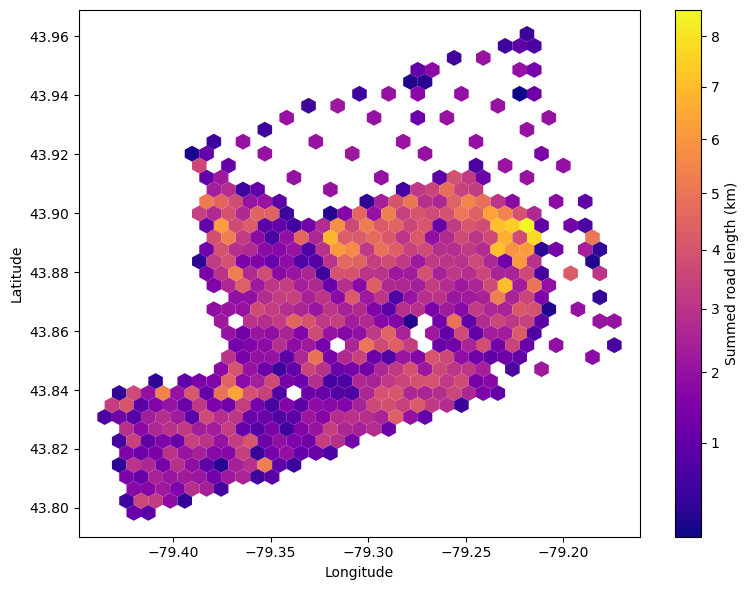

In [8]:
# ============================================================
# 6) Hexagonal Binning: Aggregated Road Length
# ============================================================

import matplotlib as mpl

plt.figure(figsize=(8, 6))

hexbin_plot = plt.hexbin(
    x=centroids["lon"],
    y=centroids["lat"],
    C=centroids["length_km"],            # value to aggregate
    reduce_C_function=np.sum,            # total length per hexagon
    gridsize=35,
    mincnt=1,
    cmap="plasma",                       # high-contrast sequential palette
    norm=mpl.colors.PowerNorm(gamma=0.8),
    linewidths=0,
    edgecolors="none"
)

cbar = plt.colorbar(hexbin_plot)
cbar.set_label("Summed road length (km)")

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()

### Insight - Hexagonal Binning
The hexbin map provides a cleaner aggregate view and reduces point overlap effectively. High-value hexagons form a broad central band, with the most intense cells concentrated toward the east-central portion of Markham. Lower-value hexes dominate the outer edges, which supports the conclusion that cumulative road length is spatially concentrated rather than evenly distributed. This map is especially useful for comparing neighboring areas at a consistent spatial unit.

*Interpretation note:* hexbin aggregation is well-suited for identifying local hotspots and gradients.

In [9]:
# ============================================================
# 7) Build Regular Grid and Aggregate Road Length by Cell
# ============================================================

# Spatial extent (WGS84): [min_lon, min_lat, max_lon, max_lat]
lon_min, lat_min, lon_max, lat_max = roads_wgs.total_bounds

# Grid resolution in degrees
grid_step = 0.01

# Grid edges (aligned to step boundaries)
lon_edges = np.arange(
    np.floor(lon_min / grid_step) * grid_step,
    np.ceil(lon_max / grid_step) * grid_step + grid_step,
    grid_step
)
lat_edges = np.arange(
    np.floor(lat_min / grid_step) * grid_step,
    np.ceil(lat_max / grid_step) * grid_step + grid_step,
    grid_step
)

# Assign each centroid to a longitude/latitude bin
grid_data = centroids.copy()
grid_data["lon_bin"] = pd.cut(
    grid_data["lon"],
    bins=lon_edges,
    labels=False,
    include_lowest=True,
    right=False
)
grid_data["lat_bin"] = pd.cut(
    grid_data["lat"],
    bins=lat_edges,
    labels=False,
    include_lowest=True,
    right=False
)

# Keep valid assignments and convert bin labels to integer indices
grid_data = grid_data.dropna(subset=["lon_bin", "lat_bin"]).copy()
grid_data["lon_bin"] = grid_data["lon_bin"].astype(int)
grid_data["lat_bin"] = grid_data["lat_bin"].astype(int)

# Aggregate total road length (km) per occupied grid cell
agg = (
    grid_data
    .groupby(["lat_bin", "lon_bin"], as_index=False)["length_km"]
    .sum()
)

# Unique cell key for joining with GeoJSON features
agg["grid_id"] = agg["lat_bin"].astype(str) + "_" + agg["lon_bin"].astype(str)

# Build GeoJSON polygons for occupied cells only
features = []
for _, row in agg.iterrows():
    i = int(row["lat_bin"])
    j = int(row["lon_bin"])

    polygon_coords = [[
        [float(lon_edges[j]),     float(lat_edges[i])],
        [float(lon_edges[j + 1]), float(lat_edges[i])],
        [float(lon_edges[j + 1]), float(lat_edges[i + 1])],
        [float(lon_edges[j]),     float(lat_edges[i + 1])],
        [float(lon_edges[j]),     float(lat_edges[i])]
    ]]

    features.append({
        "type": "Feature",
        "properties": {"grid_id": row["grid_id"]},
        "geometry": {"type": "Polygon", "coordinates": polygon_coords}
    })

# Final artifacts used by choropleth/cartogram steps
grid_geojson = {"type": "FeatureCollection", "features": features}
choro_df = agg[["grid_id", "length_km"]].copy()

print(f"Occupied grid cells: {len(choro_df)}")
display(choro_df.head())

Occupied grid cells: 239


,grid_id,length_km
0,0_1,0.214809
1,0_2,1.396266
2,1_1,2.492776
3,1_2,8.311836
4,1_3,8.279730


In [10]:
# ============================================================
# 8) Choropleth Map: Grid-Level Road Length
# ============================================================

# Attach aggregated values to GeoJSON properties (for tooltip display)
value_lookup = dict(zip(choro_df["grid_id"], choro_df["length_km"]))
for feature in grid_geojson["features"]:
    gid = feature["properties"]["grid_id"]
    feature["properties"]["length_km"] = float(value_lookup.get(gid, 0.0))

# Prepare robust bins from quantiles
values = choro_df["length_km"].dropna().astype(float).values
vmin, vmax = float(values.min()), float(values.max())
use_bins = not np.isclose(vmin, vmax)

if use_bins:
    quantiles = np.quantile(values, [0.00, 0.25, 0.50, 0.75, 1.00])

    # Enforce strictly increasing bin edges (avoid duplicates)
    bin_edges = [float(quantiles[0])]
    tiny_step = 1e-12
    for q in quantiles[1:]:
        q = float(q)
        if q <= bin_edges[-1]:
            q = bin_edges[-1] + tiny_step
        bin_edges.append(q)

    # Expand boundaries slightly to prevent floating-point exclusions
    eps = max((vmax - vmin) * 1e-9, 1e-9)
    bin_edges[0] = min(bin_edges[0], vmin) - eps
    bin_edges[-1] = max(bin_edges[-1], vmax) + eps

# Base map
m_choro_plus = folium.Map(
    location=map_center,
    zoom_start=11,
    tiles="cartodbpositron"
)

# Choropleth configuration
choropleth_args = dict(
    geo_data=grid_geojson,
    data=choro_df,
    columns=["grid_id", "length_km"],
    key_on="feature.properties.grid_id",
    fill_color="YlOrRd",
    fill_opacity=0.70,
    line_opacity=0.20,
    legend_name="Total road length (km) per grid cell"
)

if use_bins:
    choropleth_args["bins"] = bin_edges

folium.Choropleth(**choropleth_args).add_to(m_choro_plus)

# Overlay for interactive hover highlight + tooltip
folium.GeoJson(
    grid_geojson,
    style_function=lambda _: {"fillOpacity": 0.05, "weight": 0.3, "color": "black"},
    highlight_function=lambda _: {"fillOpacity": 0.20, "weight": 1.0, "color": "black"},
    tooltip=folium.GeoJsonTooltip(
        fields=["grid_id", "length_km"],
        aliases=["Grid cell", "Road length (km)"],
        localize=True,
        labels=True
    ),
    name="Grid details"
).add_to(m_choro_plus)

folium.LayerControl().add_to(m_choro_plus)
m_choro_plus

### Insight - Choropleth Map
The choropleth confirms strong spatial inequality in road-length distribution across grid cells. A relatively small share of cells carries a large share of total network length, with hotspot cells concentrated in central/east-central sections. Quantitatively, the top 10% of occupied cells account for about 23.3% of total mapped road length, while the top 20% account for about 40.7%. This indicates that infrastructure burden and corridor intensity are concentrated in specific areas.

*Interpretation note:* this pattern is valuable for maintenance prioritization and corridor-level planning.

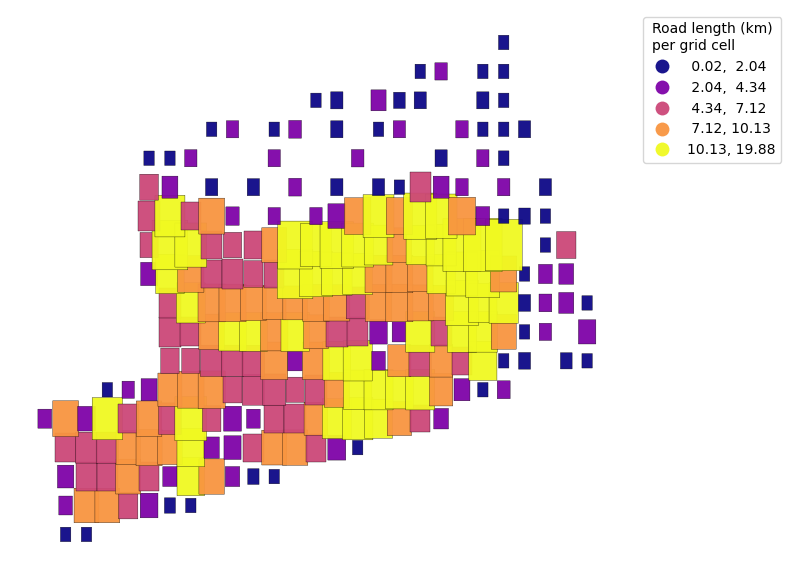

In [11]:
# ============================================================
# 9) Cartogram-like View: Grid Distortion by Road Length
# ============================================================

# Convert occupied-grid GeoJSON to GeoDataFrame
grid_gdf = gpd.GeoDataFrame.from_features(
    grid_geojson["features"], crs="EPSG:4326"
)[["grid_id", "geometry"]]

# Defensive cleanup (avoid duplicate length columns during merge)
if "length_km" in grid_gdf.columns:
    grid_gdf = grid_gdf.drop(columns=["length_km"])

# Join aggregated values (km per grid cell)
cartogram_df = grid_gdf.merge(
    choro_df[["grid_id", "length_km"]],
    on="grid_id",
    how="left"
)
cartogram_df["length_km"] = cartogram_df["length_km"].fillna(0.0).astype(float)

# Project to metric CRS for geometric scaling
cartogram_metric = cartogram_df.to_crs(epsg=32617).copy()

# Scale factor:
# - sqrt normalization reduces extreme distortion
# - clipping preserves readability
eps = 1e-9
baseline = float(cartogram_metric["length_km"].median()) + eps
cartogram_metric["scale_factor"] = np.sqrt(
    (cartogram_metric["length_km"] + eps) / baseline
).clip(0.5, 2.5)

# Scale each cell polygon around its own centroid
def scale_polygon(row):
    center = row.geometry.centroid
    return affinity.scale(
        row.geometry,
        xfact=row["scale_factor"],
        yfact=row["scale_factor"],
        origin=(center.x, center.y)
    )

cartogram_metric["geometry"] = cartogram_metric.apply(scale_polygon, axis=1)

# Convert back to WGS84 for plotting
cartogram_wgs = cartogram_metric.to_crs(epsg=4326)

# Plot with external legend for cleaner layout
fig, ax = plt.subplots(figsize=(8, 8))
plt.subplots_adjust(right=0.80)  # reserve right-side margin for legend

cartogram_wgs.plot(
    column="length_km",
    cmap="plasma",
    scheme="quantiles",
    k=5,
    legend=True,
    edgecolor="black",
    linewidth=0.25,
    alpha=0.95,
    ax=ax,
    legend_kwds={
        "title": "Road length (km)\nper grid cell",
        "loc": "upper left",
        "bbox_to_anchor": (1.02, 1.00),
        "frameon": True
    }
)

ax.set_axis_off()
plt.tight_layout()
plt.show()

### Insight - Cartogram-like Distortion
The cartogram-style output makes high-length zones visually dominant by enlarging cells with greater cumulative road length. Expanded cells cluster mainly in central and eastern bands, while low-length peripheral cells remain small and less prominent. This distortion improves visual communication of inequality: the map immediately shows where road infrastructure is concentrated, even before reading exact values.

*Interpretation note:* the cartogram is interpretive and emphasizes relative importance rather than exact geometry.

In [12]:
# ============================================================
# 10) Thematic Line Map: Road Segments Styled by Length
# ============================================================

# Keep only required attributes and geometry
line_df = roads_utm[["FULLNAME", "TYPE", "OWNER", "length_m", "geometry"]].copy()

# Geometry simplification for faster web rendering (3 meters in UTM)
line_df["geometry"] = line_df.geometry.simplify(
    tolerance=3,
    preserve_topology=True
)

# Convert to WGS84 for Folium
line_df = line_df.to_crs(epsg=4326)

# Robust styling range (reduce outlier influence)
vmin, vmax = line_df["length_m"].quantile([0.05, 0.95]).astype(float)

# Edge-case fallback if range collapses
if np.isclose(vmin, vmax):
    vmin = float(line_df["length_m"].min())
    vmax = float(line_df["length_m"].max())
    if np.isclose(vmin, vmax):
        vmax = vmin + 1.0  # avoid divide-by-zero

# Continuous colormap
colormap = cm.linear.YlOrRd_09.scale(vmin, vmax)
colormap.caption = "Road segment length (m)"

# Style function per feature
def style_fn(feature):
    length_val = float(feature["properties"]["length_m"])
    clamped = min(max(length_val, vmin), vmax)
    frac = (clamped - vmin) / (vmax - vmin + 1e-9)

    return {
        "color": colormap(clamped),
        "weight": 1.0 + 2.5 * frac,   # thicker lines for longer segments
        "opacity": 0.85
    }

# Base map
m_lines = folium.Map(
    location=map_center,
    zoom_start=11,
    tiles="cartodbpositron"
)

# Styled road layer
folium.GeoJson(
    line_df.to_json(),
    style_function=style_fn,
    tooltip=folium.GeoJsonTooltip(
        fields=["FULLNAME", "TYPE", "OWNER", "length_m"],
        aliases=["Road", "Type", "Owner", "Length (m)"],
        localize=True,
        labels=True
    ),
    name="Road segments"
).add_to(m_lines)

colormap.add_to(m_lines)
folium.LayerControl().add_to(m_lines)

m_lines

### Insight - Thematic Road-Line Map
The thematic line map reveals a clear network hierarchy. A small number of long, continuous segments form the structural backbone, while many shorter local streets create dense neighborhood meshes around them. Major corridors stand out as connected east-west and north-south routes, indicating how local access roads feed into longer arterial links. This supports the broader finding that Markham’s network combines corridor-driven mobility with dense local distribution.

*Interpretation note:* segment length here indicates geometric extent, not traffic volume or congestion.

Graph built | Nodes: 6,313 | Edges: 9,045


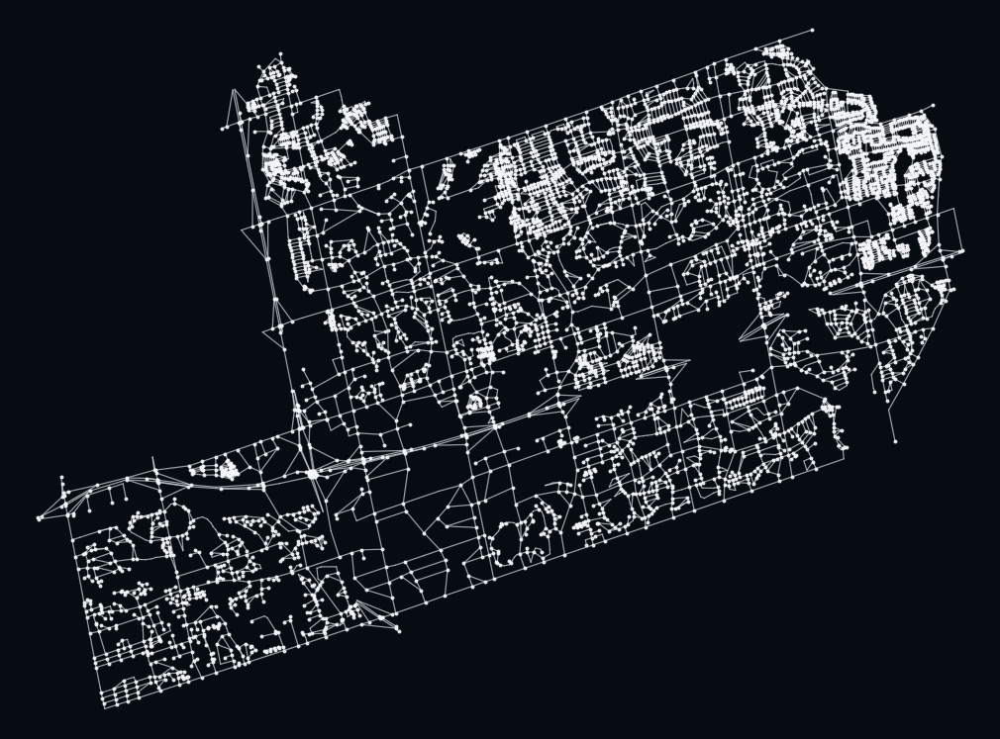

In [13]:
# ============================================================
# 11) Topology Graph (Standalone, Dataset-Only, Dark Style)
# ============================================================

import numpy as np
import networkx as nx
import geopandas as gpd
import matplotlib.pyplot as plt

from shapely.geometry import LineString, MultiLineString, GeometryCollection
from shapely.ops import unary_union

# ------------------------------------------------------------
# A) Ensure projected road geometry exists (meters)
# ------------------------------------------------------------
if "roads_utm" not in globals():
    if "roads" not in globals():
        raise RuntimeError("Neither 'roads_utm' nor 'roads' found. Run dataset loading cell first.")
    if roads.crs is None:
        roads = roads.set_crs(epsg=4326)
    roads_wgs = roads.to_crs(epsg=4326)
    roads_utm = roads_wgs.to_crs(epsg=32617).copy()

# ------------------------------------------------------------
# B) Build topology graph G from dataset geometry
#    (noded at intersections via unary_union)
# ------------------------------------------------------------
def extract_lines(geom):
    if geom is None or geom.is_empty:
        return
    if isinstance(geom, LineString):
        yield geom
    elif isinstance(geom, MultiLineString):
        for g in geom.geoms:
            yield from extract_lines(g)
    elif isinstance(geom, GeometryCollection):
        for g in geom.geoms:
            yield from extract_lines(g)

line_gdf = roads_utm[["geometry"]].copy()
line_gdf = line_gdf[line_gdf.geometry.notna() & ~line_gdf.geometry.is_empty].copy()
line_gdf = line_gdf.explode(index_parts=False, ignore_index=True)
line_gdf = line_gdf[line_gdf.geometry.geom_type.isin(["LineString", "MultiLineString"])].copy()

noded_geom = unary_union(line_gdf.geometry.values)
segments = list(extract_lines(noded_geom))

G = nx.Graph()
for seg in segments:
    coords = list(seg.coords)
    if len(coords) < 2:
        continue

    # round to reduce floating-point duplicate nodes
    u = (round(coords[0][0], 1), round(coords[0][1], 1))
    v = (round(coords[-1][0], 1), round(coords[-1][1], 1))
    if u == v:
        continue

    G.add_node(u, x=u[0], y=u[1])
    G.add_node(v, x=v[0], y=v[1])
    G.add_edge(u, v, length_m=float(seg.length))

print(f"Graph built | Nodes: {G.number_of_nodes():,} | Edges: {G.number_of_edges():,}")

# ------------------------------------------------------------
# C) Visual cleanup (gentle filtering)
# ------------------------------------------------------------
KEEP_LARGEST_COMPONENT = True
MAX_EDGE_LEN_Q = 0.99         # remove top 1% longest edges
REMOVE_LONG_DANGLING = True
DANGLING_Q = 0.90
MIN_COMPONENT_NODES = 20
PLOT_ONLY_INTERSECTIONS = True

H = G.copy()
if KEEP_LARGEST_COMPONENT and H.number_of_nodes() > 0:
    largest_cc = max(nx.connected_components(H), key=len)
    H = H.subgraph(largest_cc).copy()

raw_edges = [(u, v, d) for u, v, d in H.edges(data=True)]
lengths = np.array([float(d.get("length_m", 0.0)) for _, _, d in raw_edges], dtype=float)
deg = dict(H.degree())

if np.any(lengths > 0):
    len_thr = float(np.quantile(lengths[lengths > 0], MAX_EDGE_LEN_Q))
    dangling_thr = float(np.quantile(lengths[lengths > 0], DANGLING_Q))
else:
    len_thr = np.inf
    dangling_thr = np.inf

kept_edges = []
for u, v, d in raw_edges:
    L = float(d.get("length_m", 0.0))

    # suppress extreme long edges
    if L > len_thr:
        continue

    # suppress long dangling branches
    if REMOVE_LONG_DANGLING:
        is_dangling = (deg.get(u, 0) == 1) or (deg.get(v, 0) == 1)
        if is_dangling and L > dangling_thr:
            continue

    kept_edges.append((u, v, d))

# Build filtered graph
Hf = nx.Graph()
for n, attrs in H.nodes(data=True):
    Hf.add_node(n, **attrs)
for u, v, attrs in kept_edges:
    Hf.add_edge(u, v, **attrs)

# remove isolates and tiny components
Hf.remove_nodes_from(list(nx.isolates(Hf)))
small_components = [c for c in nx.connected_components(Hf) if len(c) < MIN_COMPONENT_NODES]
for comp in small_components:
    Hf.remove_nodes_from(comp)

# fallback if too aggressive
if Hf.number_of_nodes() == 0:
    Hf = H.copy()
else:
    largest_cc = max(nx.connected_components(Hf), key=len)
    Hf = Hf.subgraph(largest_cc).copy()

# ------------------------------------------------------------
# D) Plot (dark style)
# ------------------------------------------------------------
BG_COLOR = "#070b12"
EDGE_COLOR = "#d6dbe1"
NODE_COLOR = "#f5f7fa"
FRAME_COLOR = "#f0f0f0"

fig, ax = plt.subplots(figsize=(10, 10), facecolor=BG_COLOR)
ax.set_facecolor(BG_COLOR)

# edges
for u, v, d in Hf.edges(data=True):
    x1, y1 = Hf.nodes[u]["x"], Hf.nodes[u]["y"]
    x2, y2 = Hf.nodes[v]["x"], Hf.nodes[v]["y"]
    ax.plot(
        [x1, x2], [y1, y2],
        color=EDGE_COLOR, linewidth=0.9, alpha=0.70,
        solid_capstyle="round", zorder=1
    )

# nodes
if PLOT_ONLY_INTERSECTIONS:
    nodes_to_plot = [n for n, degree in Hf.degree() if degree != 2]
else:
    nodes_to_plot = list(Hf.nodes)

xs = [Hf.nodes[n]["x"] for n in nodes_to_plot]
ys = [Hf.nodes[n]["y"] for n in nodes_to_plot]
ax.scatter(xs, ys, s=8, c=NODE_COLOR, alpha=0.92, linewidths=0, zorder=2)

# tight bounds
all_x = [Hf.nodes[n]["x"] for n in Hf.nodes]
all_y = [Hf.nodes[n]["y"] for n in Hf.nodes]
pad_x = (max(all_x) - min(all_x)) * 0.03
pad_y = (max(all_y) - min(all_y)) * 0.03
ax.set_xlim(min(all_x) - pad_x, max(all_x) + pad_x)
ax.set_ylim(min(all_y) - pad_y, max(all_y) + pad_y)

ax.set_aspect("equal")
ax.set_axis_off()

for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color(FRAME_COLOR)
    spine.set_linewidth(3)

plt.tight_layout(pad=0.35)
plt.show()

### Insight - Road Network Topology

The topology graph contains 6,313 nodes and 9,045 edges, indicating a large and well-defined urban road network. The visualization shows a clear structural hierarchy: dense clusters of short local streets are connected by longer arterial corridors that support movement across wider areas. Connectivity is not uniform across space. Some zones display compact, highly connected street meshes, while others are more linear and corridor-driven. This figure emphasizes network form and linkage patterns (how roads connect).

In [14]:
# ============================================================
# 12) Summary Table: Road Length by Ownership
# ============================================================

# Total length (km) by owner
owner_length = (
    roads_utm
    .groupby(roads_utm["OWNER"].fillna("Unknown"))["length_km"]
    .sum()
    .sort_values(ascending=False)
)

# Percentage contribution by owner
owner_share = (owner_length / owner_length.sum() * 100).round(1)

# Top categories
owner_summary = pd.DataFrame({
    "length_km": owner_length.round(2),
    "share_pct": owner_share
}).head(10)

print("Top owners by cumulative road length:")
display(owner_summary)

Top owners by cumulative road length:


,length_km,share_pct
OWNER,,
City of Markham,1096.18,73.2
Region of York,170.10,11.4
SLF Joint Ventu,99.22,6.6
MTO,55.56,3.7
Private Road,54.44,3.6
City of Toronto,21.08,1.4


In [15]:
# ============================================================
# 13) Summary Table: Road Length by Road Type
# ============================================================

# Total length (km) by road type
type_length = (
    roads_utm
    .groupby(roads_utm["TYPE"].fillna("Unknown"))["length_km"]
    .sum()
    .sort_values(ascending=False)
)

# Percentage contribution by type
type_share = (type_length / type_length.sum() * 100).round(1)

# Top categories
type_summary = pd.DataFrame({
    "length_km": type_length.round(2),
    "share_pct": type_share
}).head(10)

print("Top road types by cumulative road length:")
display(type_summary)

Top road types by cumulative road length:


,length_km,share_pct
TYPE,,
Unknown,250.98,16.8
Ave,232.13,15.5
Dr,223.05,14.9
Rd,213.98,14.3
Cres,150.94,10.1
St,120.79,8.1
Blvd,55.77,3.7
Crt,53.37,3.6
Lane,43.03,2.9


In [16]:
# ============================================================
# 14) Summary Table: Top Road Names by Cumulative Length
# ============================================================

# Total length (km) by full road name
top_road_names = (
    roads_utm
    .groupby(roads_utm["FULLNAME"].fillna("Unknown"))["length_km"]
    .sum()
    .sort_values(ascending=False)
    .head(10)
)

print("Top road names by cumulative road length:")
display(top_road_names.round(2).to_frame(name="length_km"))

Top road names by cumulative road length:


,length_km
FULLNAME,
Lane,75.32
Hwy 407,44.57
Hwy 404,26.29
Hwy 7 E,21.70
Steeles Ave E,21.08
16th Ave,15.82
14th Ave,15.57
Major Mackenzie Dr E,15.46
Elgin Mills Rd E,15.18


## Conclusion

This geospatial analysis of the City of Markham road network shows that road infrastructure is spatially concentrated rather than uniformly distributed. Across all visualization formats, a consistent pattern emerges: many short local streets form dense neighborhood meshes, while a smaller set of longer arterial corridors provides the main structural backbone.

The aggregated maps (hexbin, choropleth, and cartogram-like view) identify high-intensity zones where cumulative road length is concentrated. The thematic line and topology visualizations further confirm a hierarchical network in which local links connect into major movement corridors.